In [1]:
import scanpy as sc
import pandas as pd
from matplotlib import pylab
import random
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os
import itertools
import plotly.express as px
import yaml


import numpy as np
import random
import anndata as ad
from scipy.sparse import  csr_matrix, issparse
from scipy import sparse

from matplotlib.colors import TwoSlopeNorm

import scanpy.external as sce
import sys

import scvelo as scv

In [2]:
import anndata
import rapids_singlecell as rsc

In [3]:

sc.settings.set_figure_params(dpi=80, facecolor='white', dpi_save=500)
pylab.rcParams['figure.figsize'] = (6, 6)
homeDir = os.getenv("HOME")
sys.path.insert(1, homeDir+"/utils/")

from PlotPCA_components import *
from AtlasClasses import *
DS="hormones_substudy"
ReferenceTissue="cortex"

with open(homeDir+"/utils/ReferenceDict.yaml", 'r') as file:
    ReferencePaths = yaml.safe_load(file)
    for k in list(ReferencePaths.keys()):
        ReferencePaths[k]["adataPath"] = "/group/testa/Users/davide.castaldi/Polaroids_spinoff"+ReferencePaths[k]["adataPath"]
        #ReferencePaths[k]["signaturePath"] = homeDir+ReferencePaths[k]["signaturePath"]
        ReferencePaths[k]["signaturePath"] = "/group/testa/Users/davide.castaldi/Polaroids_spinoff"+ReferencePaths[k]["signaturePath"]
        ReferencePaths[k]["signaturePurityPath"] = "/group/testa/Users/davide.castaldi/Polaroids_spinoff"+ReferencePaths[k]["signaturePurityPath"]


ReferencePaths


{'cortex': {'dsname': 'Poliudakis2019_cortex',
  'adataPath': '/group/testa/Users/davide.castaldi/Polaroids_spinoff/2_GenerateReferences/cortex.Reference.h5ad',
  'signaturePath': '/group/testa/Users/davide.castaldi/Polaroids_spinoff/2_GenerateReferences/cortex.SignatureGenes.tsv',
  'signaturePurityPath': '/group/testa/Users/davide.castaldi/Polaroids_spinoff/2_GenerateReferences/cortex.SignaturesPurity.tsv',
  'LabelTtransferAggregation': {'oRG': 'Glia',
   'IP': 'IP',
   'ExcitatoryDeepLayer': 'ExcitatoryNeuron',
   'Cycling': 'Cycling',
   'ExcitatoryMigrating': 'ExcitatoryNeuron',
   'Excitatory': 'ExcitatoryNeuron',
   'Endothelium': 'Vascular',
   'vRG': 'Glia',
   'Inhibitory': 'ForebrainInhibitory',
   'OPC': 'OPC',
   'Mic': 'Mic'},
  'RelevantContrasts': {'Inh_vs_Exc': ['cortex_Inhibitory',
    'cortex_Excitatory'],
   'Exc_vs_cycling': ['cortex_Excitatory', 'cortex_CyclingProgenitors']}},
 'cerebellum': {'dsname': 'Aldinger2021_cerebellum',
  'adataPath': '/group/testa/Users

# Import

In [4]:
adata = sc.read_h5ad("./adatas/5.1.{}.PostQC.h5ad".format(DS))


In [5]:
pcs=25
n_neighbs=50
seed = 437

In [6]:
del adata.layers["normalized"]

In [7]:
if issparse(adata.X) == False:
    adata.X = csr_matrix(adata.X).astype(np.float32)
    print('Converted adata.X to', type(adata.X))

if issparse(adata.layers["counts"]) == False:
    adata.layers["counts"] = csr_matrix(adata.layers["counts"]).astype(np.float32)
    print('Converted counts layer to', type(adata.layers["counts"]))

In [8]:
# # Move counts to GPU
# import cupyx.scipy.sparse
# import random
# from scipy import sparse
# import rmm
# from _utils import allocate_GPU
# from rmm.allocators.cupy import rmm_cupy_allocator
# import cupy as cp

# if adata.X.dtype not in [np.float32, cp.float32]:
#     try:
#         adata.X = cupyx.scipy.sparse.csr_matrix(adata.X.astype(cp.float32))
#     except Exception:
#         adata.X = sparse.csr_matrix(adata.X.astype(np.float32))
#         adata.X = cupyx.scipy.sparse.csr_matrix(adata.X)
# else:
#     adata.X = cupyx.scipy.sparse.csr_matrix(adata.X)

# rsc.get.anndata_to_GPU(adata)

# 1) Intra-condition DEGs Seurat flavour

In [9]:
HVGSCondict = {}
for line in adata.obs["line"].unique().tolist():
    adataGenotype = adata[adata.obs["line"] == line]
    for condition in adataGenotype.obs["condition"].unique().tolist():
        adataCOnd = adataGenotype[adataGenotype.obs["condition"] == condition].copy()

        if condition not in list(HVGSCondict.keys()):
            HVGSCondict[condition] = []

        #Print Nsamples
        nsamples = len(adataCOnd.obs["sample_id"].unique().tolist())
        print(f"Found {nsamples} repliacates for {line} {condition}")
        if nsamples < 3:
            minOverlap = nsamples
        else:
            minOverlap = nsamples-1
        print(f"Only HVGs common to {minOverlap} replicates will be kept")

        sc.pp.highly_variable_genes(adataCOnd, batch_key="sample_id", flavor="seurat", n_top_genes=2000)
        CommonHVGs = set(adataCOnd.var_names[adataCOnd.var["highly_variable_nbatches"] >= minOverlap])
        nHVGs = len(CommonHVGs)
        print(f"Found {nHVGs} common HVGs across {minOverlap} replicates for line {line} exposure {condition} ")
        print("\n")
        HVGSCondict[condition].append(CommonHVGs)

Found 3 repliacates for CTL04E ESTROGEN_AGONIST
Only HVGs common to 2 replicates will be kept
Found 1322 common HVGs across 2 replicates for line CTL04E exposure ESTROGEN_AGONIST 


Found 3 repliacates for CTL04E ESTROGEN_ANTAGONIST
Only HVGs common to 2 replicates will be kept
Found 1359 common HVGs across 2 replicates for line CTL04E exposure ESTROGEN_ANTAGONIST 


Found 3 repliacates for CTL04E ANDROGEN_AGONIST
Only HVGs common to 2 replicates will be kept
Found 1223 common HVGs across 2 replicates for line CTL04E exposure ANDROGEN_AGONIST 


Found 3 repliacates for CTL04E ANDROGEN_ANTAGONIST
Only HVGs common to 2 replicates will be kept
Found 1244 common HVGs across 2 replicates for line CTL04E exposure ANDROGEN_ANTAGONIST 


Found 3 repliacates for CTL04E ARYL_HYD_AGONIST
Only HVGs common to 2 replicates will be kept
Found 1258 common HVGs across 2 replicates for line CTL04E exposure ARYL_HYD_AGONIST 


Found 3 repliacates for CTL04E ARYL_HYD_ANTAGONIST
Only HVGs common to 2 repli

# 2) Inter-condition DEGs by line Seurat flavour

In [10]:

sc.pp.highly_variable_genes(adata, batch_key="line", flavor="seurat", n_top_genes=2000)
HVGSLine = set(adata.var_names[adata.var["highly_variable_nbatches"] == len(adata.obs["line"].unique())].tolist())
nHVGSLine = len(HVGSLine)
print(f"Found {nHVGSLine} common pan-condition HVGs across both lines ")

# for line in adata.obs["line"].unique().tolist():
#     adataGenotype = adata[adata.obs["line"] == line]
#     sc.pp.highly_variable_genes(adataCOnd, batch_key="sample_id", flavor="seurat", n_top_genes=2000)

#     for condition in adataGenotype.obs["condition"].unique().tolist():
#         adataCOnd = adataGenotype[adataGenotype.obs["condition"] == condition].copy()

#         if condition not in list(HVGSCondict.keys()):
#             HVGSCondict[condition] = []

#         #Print Nsamples
#         nsamples = len(adataCOnd.obs["sample_id"].unique().tolist())
#         print(f"Found {nsamples} repliacates for {line} {condition}")
#         if nsamples < 3:
#             minOverlap = nsamples
#         else:
#             minOverlap = nsamples-1
#         print(f"Only HVGs common to {minOverlap} replicates will be kept")

#         sc.pp.highly_variable_genes(adataCOnd, batch_key="sample_id", flavor="seurat", n_top_genes=2000)
#         CommonHVGs = set(adataCOnd.var_names[adataCOnd.var["highly_variable_nbatches"] >= minOverlap])
#         nHVGs = len(CommonHVGs)
#         print(f"Found {nHVGs} common HVGs across {minOverlap} replicates for line {line} exposure {condition} ")
#         print("\n")
#         HVGSCondict[condition].append(CommonHVGs)

Found 932 common pan-condition HVGs across both lines 


## 3) Combine both HVGs sets

In [11]:

##### First HVGs set
##### First HVGs set

IntersectionDEGs = []
for k in list(HVGSCondict.keys()):
    IntersectionDEGsCond = list(set.intersection(*HVGSCondict[k]))
    nIntersectionDEGsCond = len(IntersectionDEGsCond)
    #print(f"Found {nIntersectionDEGsCond} HVGs from the intersection of both genotypes replicates for exposure {condition} ")
    IntersectionDEGs.extend(IntersectionDEGsCond)

IntersectionDEGs = set(IntersectionDEGs)
nIntersectionDEGsCond = len(IntersectionDEGs)
print(f"Found {nIntersectionDEGsCond} HVGs from the intersection of both genotypes replicates for exposure {condition} ")

##### Second HVGs set
##### Second HVGs set

FinalHVGs = list(IntersectionDEGs.union(HVGSLine))
nFinalHVGs = len(FinalHVGs)
print(f"Found {nFinalHVGs} HVGs from the intersection of both genotypes replicates and across exposures ")


Found 2181 HVGs from the intersection of both genotypes replicates for exposure RET_ANTAGONIST 
Found 2407 HVGs from the intersection of both genotypes replicates and across exposures 


# Store HVGs and run dimreduct



In [12]:
adata.var["highly_variable_seurat_overlap"] = adata.var_names.isin(FinalHVGs)
print(adata.var["highly_variable_seurat_overlap"].sum())
adata.var["highly_variable"] = adata.var["highly_variable_seurat_overlap"]
adata.layers["logNorm"] = adata.X.copy()
sc.pp.scale(adata)

2407


In [13]:

adata.layers["scaled"] = adata.X.copy()
sc.pp.pca(adata, use_highly_variable=True)
sc.pp.neighbors(adata, n_pcs=pcs, n_neighbors=n_neighbs, random_state=seed)
adata.X = adata.layers["logNorm"].copy()


# Harmony

In [14]:
rsc.pp.harmony_integrate(adata, key="line")
rsc.pp.neighbors(adata, n_pcs=pcs, n_neighbors=n_neighbs, random_state=seed, use_rep="X_pca_harmony")
sc.tl.umap(adata)

CUDARuntimeError: cudaErrorNoDevice: no CUDA-capable device is detected

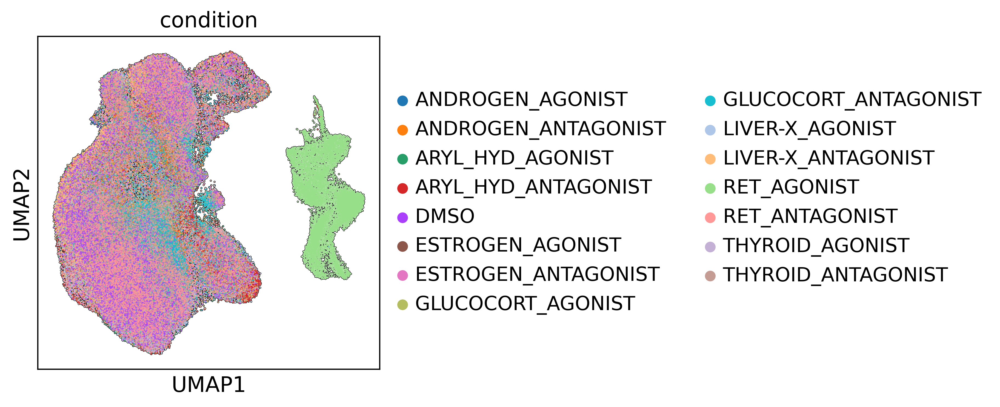

In [ ]:
sc.settings.set_figure_params(dpi=200, facecolor='white', dpi_save=500)
pylab.rcParams['figure.figsize'] = (4, 4)
sc.pl.umap(adata, color=["condition"], size=3, vmin='p1', vmax='p99', add_outline=True, outline_width=(.3,0))

In [ ]:
# Restore initial params
sc.settings.set_figure_params(dpi=80, facecolor='white', dpi_save=500)
pylab.rcParams['figure.figsize'] = (6, 6)

# Leiden partitioning

In [46]:
rsc.tl.leiden(adata, resolution=1.5, copy=False, random_state=seed, key_added="Leiden_1" )

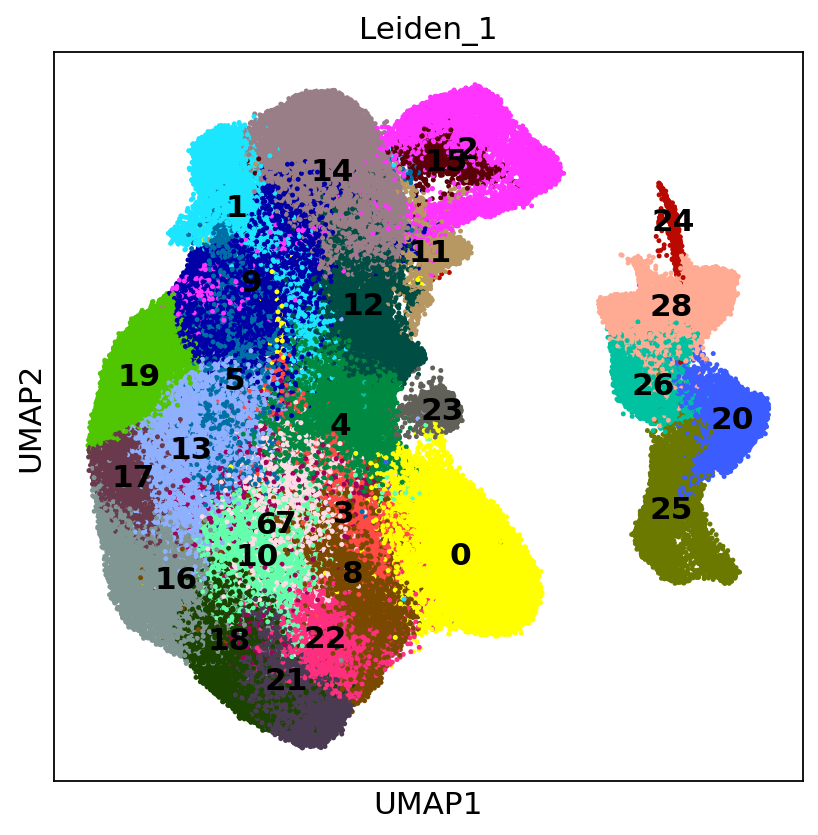

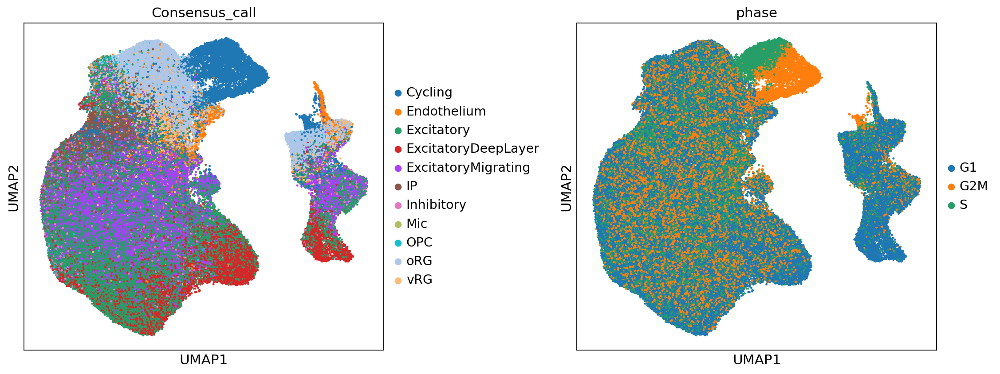

In [47]:
sc.pl.umap(adata, color=[c for c in adata.obs.columns if "Leiden_" in c], wspace=.4, size=20, legend_loc="on data")
sc.pl.umap(adata, color=["Consensus_call","phase"], wspace=.4, size=20)

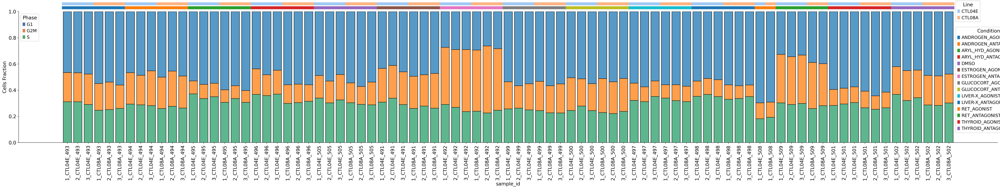

In [40]:
Compositions = adata.obs.groupby(["sample_id","phase"], as_index=False).size()
Compositions["SampleNormSize"] = Compositions["size"].divide(Compositions.groupby("sample_id")["size"].sum().loc[Compositions.sample_id].to_numpy())
Compositions["Condition"] = pd.crosstab(adata.obs["sample_id"], adata.obs["condition"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions["line"] = pd.crosstab(adata.obs["sample_id"], adata.obs["line"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions


import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.patches as mpatches

# Sort the DataFrame by 'Condition' and 'line'
Compositions_sorted = Compositions.sort_values(["Condition", "line"])

# Ensure the sample order is preserved as a categorical type
Compositions_sorted["sample_id"] = pd.Categorical(
    Compositions_sorted["sample_id"],
    Compositions_sorted["sample_id"].unique().tolist()
)

# Plot with sorted x-axis
fig, ax = plt.subplots(1, 1, figsize=(30, 7), dpi=100)
sns.histplot(
    data=Compositions_sorted, 
    x="sample_id", 
    hue="phase", 
    weights="SampleNormSize",
    multiple="stack", 
    shrink=0.8,
    ax=ax
)

ax.set_ylabel("Cells Fraction")
ax.set(ylim=(0, 1))
sns.despine(ax=ax)

# Try to retrieve the auto-generated legend handles/labels for phase
macro_handles, macro_labels = ax.get_legend_handles_labels()
# Remove the auto legend to avoid conflicts.
if ax.get_legend() is not None:
    ax.get_legend().remove()

# If macro_handles is empty, build the legend manually.
if len(macro_handles) == 0:
    macro_unique = Compositions_sorted["phase"].unique()
    # Use a palette (here we use "deep" which is commonly used by seaborn)
    macro_palette = sns.color_palette("deep", n_colors=len(macro_unique))
    macro_dict = {macro: color for macro, color in zip(macro_unique, macro_palette)}
    macro_handles = [mpatches.Patch(color=color, label=macro) for macro, color in macro_dict.items()]
    macro_labels = list(macro_dict.keys())

# Group info by sample_id for Condition and line
group_info = Compositions_sorted.groupby("sample_id").agg({"Condition": "first", "line": "first"})

# Get x positions for categorical data
xticks = ax.get_xticks()
samples_order = list(Compositions_sorted["sample_id"].cat.categories)
sample_to_x = {sample: xtick for sample, xtick in zip(samples_order, xticks)}

# Assign colors for Conditions and lines
unique_conditions = group_info["Condition"].unique()
unique_lines = group_info["line"].unique()
condition_colors = {
    cond: color for cond, color in zip(unique_conditions, sns.color_palette("tab10", n_colors=len(unique_conditions)))
}
line_colors = {
    line: color for line, color in zip(unique_lines, sns.color_palette("pastel", n_colors=len(unique_lines)))
}

# Use a transform that uses data coordinates for x and axes coordinates for y
trans = ax.get_xaxis_transform()

# Add colored bars above the main plot for each sample
for sample, row in group_info.iterrows():
    x_center = sample_to_x[sample]
    rect_width = 1  # each category is assumed to be width 1
    
    ax.add_patch(mpatches.Rectangle((x_center - 0.5, 1.02), rect_width, 0.02,
                                    color=condition_colors[row["Condition"]],
                                    transform=trans,
                                    clip_on=False))
    ax.add_patch(mpatches.Rectangle((x_center - 0.5, 1.05), rect_width, 0.02,
                                    color=line_colors[row["line"]],
                                    transform=trans,
                                    clip_on=False))

# Create custom legends for Condition and line groupings
condition_legend = [mpatches.Patch(color=color, label=cond) for cond, color in condition_colors.items()]
line_legend = [mpatches.Patch(color=color, label=line) for line, color in line_colors.items()]

# Adjust the right margin to make room for legends
fig.subplots_adjust(right=1.5)

# Place legends outside the main axes
legend_macro = ax.legend(handles=macro_handles, labels=macro_labels, title="Phase", loc="upper left", bbox_to_anchor=(0, 1))
ax.add_artist(legend_macro)
legend_condition = ax.legend(handles=condition_legend, title="Condition", loc="upper left", bbox_to_anchor=(.955, .9))
ax.add_artist(legend_condition)
legend_line = ax.legend(handles=line_legend, title="Line", loc="upper left", bbox_to_anchor=(.955, 1.1))
ax.add_artist(legend_line)
ax.grid(False)


plt.xticks(rotation=90)
#plt.savefig(f"./figures/{DS}.Prefilt.scaled.CyclingRate.svg", bbox_inches="tight")
plt.show()


# We plot top markers for leiden

In [48]:
rsc.tl.rank_genes_groups_logreg(adata, groupby="Leiden_1", use_raw=False)

[W] [10:13:27.183515] L-BFGS: max iterations reached
[W] [10:13:27.184928] Maximum iterations reached before solver is converged. To increase model accuracy you can increase the number of iterations (max_iter) or improve the scaling of the input data.


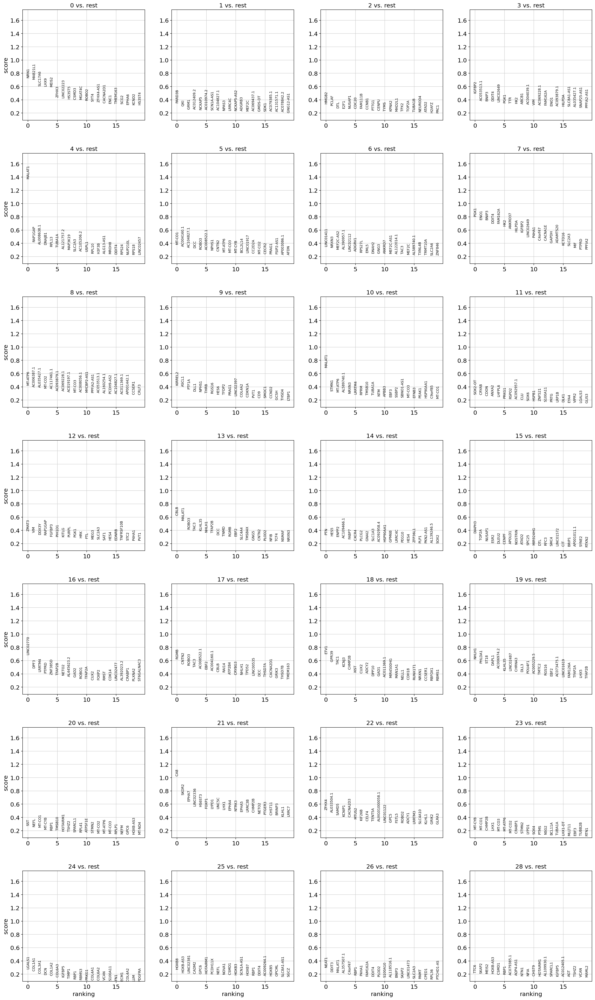

In [49]:
sc.pl.rank_genes_groups(adata)

Markers for Endothelium


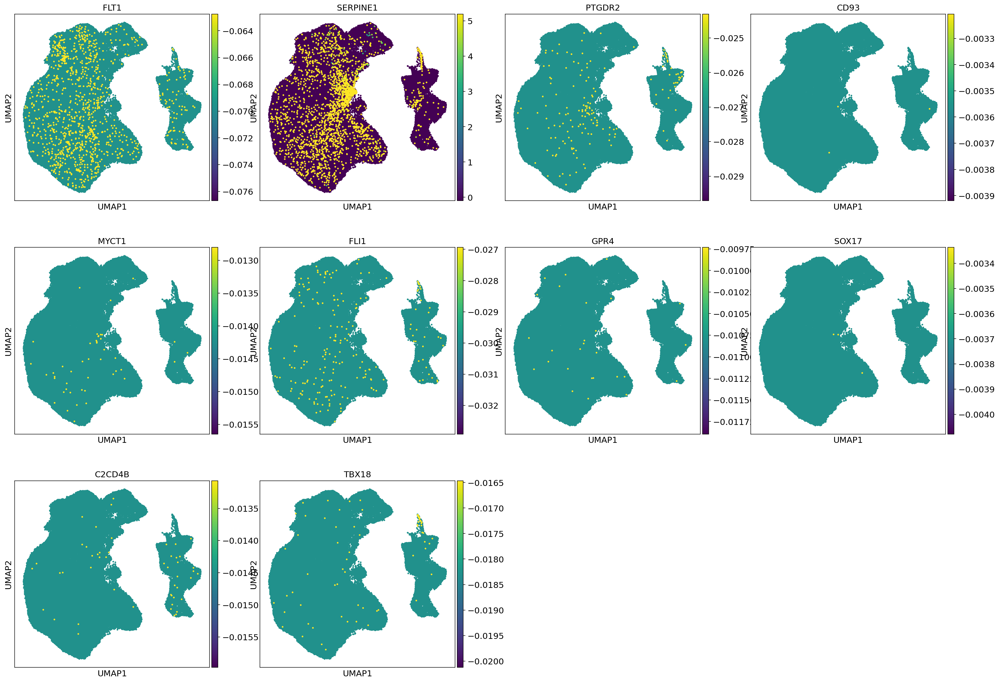

In [50]:
AtlasMarkers = pd.read_excel("/group/testa/Users/davide.castaldi/ENDPOINTS_sc/genes/CelltrypeMarkers.xlsx", index_col=0)

for k in ["Endothelium"]:
    print(f"Markers for {k}")
    MarkerList = AtlasMarkers.loc[AtlasMarkers.Group == k,"Gene"].tolist()
    MarkerList = [i for i in MarkerList if i in adata.var_names]
    MinCells = adata.shape[0] *0.02
    #MarkerList = adata[:,MarkerList].var_names[((adata[:,MarkerList].X > 0).sum(axis = 0) > MinCells).flatten().A1].tolist()
    if len(MarkerList) == 0:
        print(f"Expression of {k} markers detected in less than {MinCells}: skipping")
        continue
    
    sc.pl.umap(adata, color=MarkerList, size=30,layer="scaled",use_raw=False, vmax='p99')




# First annotation/filter refinement tier


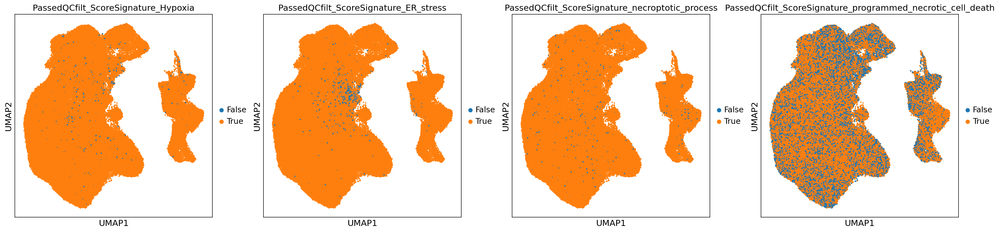

In [51]:
sc.pl.umap(adata, color=[i for i in adata.obs.columns if "PassedQCfilt_ScoreSignature_" in i], size=20)

In [52]:
# We remove ER stressed cells according to GO scoring since they are localized in cluster also predicted as endothelium from cross annotation
adata = adata[adata.obs["PassedQCfilt_ScoreSignature_ER_stress"]].copy()
# We additionally remove all cells cross-labeled as endothelium (mainly leiden_1: 19 & 20 )
adata = adata[adata.obs["Consensus_call"] != "Endothelium"].copy()
adata = adata[~adata.obs["Leiden_1"].isin(["24","11"])].copy()
# Next we remove lieden_1: cluster 7 displaying  heterogeneus markers as top scoring genes
# adata = adata[adata.obs["Leiden_1"] != "7"].copy()


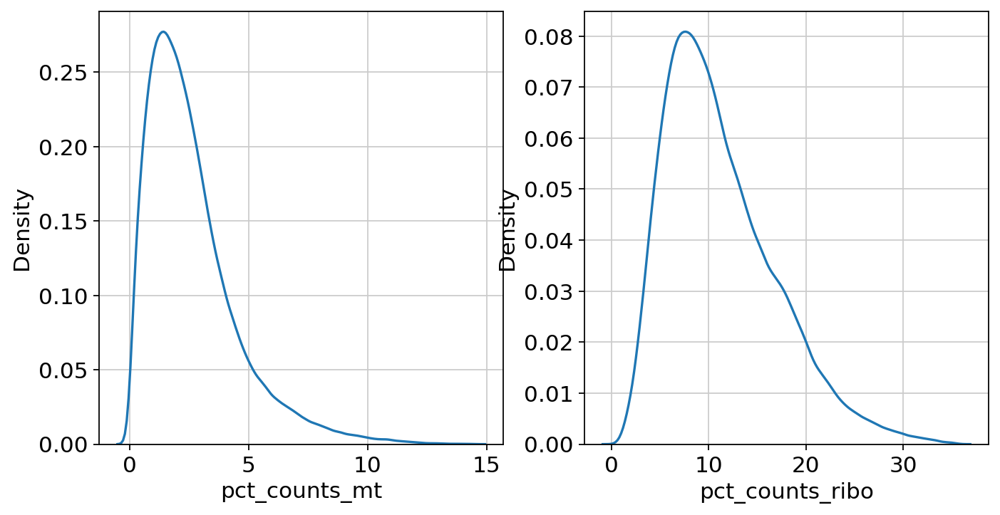

In [53]:
fig, axes = plt.subplots(1,2, figsize=(10,5))
axes[0] = sns.kdeplot(adata.obs["pct_counts_mt"], ax = axes[0])
axes[1] = sns.kdeplot(adata.obs["pct_counts_ribo"], ax = axes[1])
plt.show()

adata = adata[(adata.obs["pct_counts_mt"] <= 5) & (adata.obs["pct_counts_ribo"] <= 20)].copy()

## Re-run HVGs selection dimreduction and integration 

In [54]:
HVGSCondict = {}
for line in adata.obs["line"].unique().tolist():
    adataGenotype = adata[adata.obs["line"] == line]
    for condition in adataGenotype.obs["condition"].unique().tolist():
        adataCOnd = adataGenotype[adataGenotype.obs["condition"] == condition].copy()

        if condition not in list(HVGSCondict.keys()):
            HVGSCondict[condition] = []

        #Print Nsamples
        nsamples = len(adataCOnd.obs["sample_id"].unique().tolist())
        print(f"Found {nsamples} repliacates for {line} {condition}")
        if nsamples < 3:
            minOverlap = nsamples
        else:
            minOverlap = nsamples-1
        print(f"Only HVGs common to {minOverlap} replicates will be kept")

        sc.pp.highly_variable_genes(adataCOnd, batch_key="sample_id", flavor="seurat", n_top_genes=2000)
        CommonHVGs = set(adataCOnd.var_names[adataCOnd.var["highly_variable_nbatches"] >= minOverlap])
        nHVGs = len(CommonHVGs)
        print(f"Found {nHVGs} common HVGs across {minOverlap} replicates for line {line} exposure {condition} ")
        print("\n")
        HVGSCondict[condition].append(CommonHVGs)

Found 3 repliacates for CTL04E ESTROGEN_AGONIST
Only HVGs common to 2 replicates will be kept
Found 1274 common HVGs across 2 replicates for line CTL04E exposure ESTROGEN_AGONIST 


Found 3 repliacates for CTL04E ESTROGEN_ANTAGONIST
Only HVGs common to 2 replicates will be kept
Found 1272 common HVGs across 2 replicates for line CTL04E exposure ESTROGEN_ANTAGONIST 


Found 3 repliacates for CTL04E ANDROGEN_AGONIST
Only HVGs common to 2 replicates will be kept
Found 1192 common HVGs across 2 replicates for line CTL04E exposure ANDROGEN_AGONIST 


Found 3 repliacates for CTL04E ANDROGEN_ANTAGONIST
Only HVGs common to 2 replicates will be kept
Found 1213 common HVGs across 2 replicates for line CTL04E exposure ANDROGEN_ANTAGONIST 


Found 3 repliacates for CTL04E ARYL_HYD_AGONIST
Only HVGs common to 2 replicates will be kept
Found 1287 common HVGs across 2 replicates for line CTL04E exposure ARYL_HYD_AGONIST 


Found 3 repliacates for CTL04E ARYL_HYD_ANTAGONIST
Only HVGs common to 2 repli

# 2) Inter-condition DEGs by line Seurat flavour

In [55]:

sc.pp.highly_variable_genes(adata, batch_key="line", flavor="seurat", n_top_genes=2000)
HVGSLine = set(adata.var_names[adata.var["highly_variable_nbatches"] == len(adata.obs["line"].unique())].tolist())
nHVGSLine = len(HVGSLine)
print(f"Found {nHVGSLine} common pan-condition HVGs across both lines ")



Found 981 common pan-condition HVGs across both lines 


## 3) Combine both HVGs sets

In [56]:

##### First HVGs set
##### First HVGs set

IntersectionDEGs = []
for k in list(HVGSCondict.keys()):
    IntersectionDEGsCond = list(set.intersection(*HVGSCondict[k]))
    nIntersectionDEGsCond = len(IntersectionDEGsCond)
    #print(f"Found {nIntersectionDEGsCond} HVGs from the intersection of both genotypes replicates for exposure {condition} ")
    IntersectionDEGs.extend(IntersectionDEGsCond)

IntersectionDEGs = set(IntersectionDEGs)
nIntersectionDEGsCond = len(IntersectionDEGs)
print(f"Found {nIntersectionDEGsCond} HVGs from the intersection of both genotypes replicates for exposure {condition} ")

##### Second HVGs set
##### Second HVGs set

FinalHVGs = list(IntersectionDEGs.union(HVGSLine))
nFinalHVGs = len(FinalHVGs)
print(f"Found {nFinalHVGs} HVGs from the intersection of both genotypes replicates and across exposures ")


Found 2121 HVGs from the intersection of both genotypes replicates for exposure RET_ANTAGONIST 
Found 2350 HVGs from the intersection of both genotypes replicates and across exposures 


# Store HVGs and run dimreduct



In [ ]:
adata.var["highly_variable_seurat_overlap"] = adata.var_names.isin(FinalHVGs)
print(adata.var["highly_variable_seurat_overlap"].sum())
adata.var["highly_variable"] = adata.var["highly_variable_seurat_overlap"]
sc.pp.scale(adata)
adata.layers["scaled"] = adata.X.copy()
sc.pp.pca(adata, use_highly_variable=True)
sc.pp.neighbors(adata, n_pcs=pcs, n_neighbors=n_neighbs)
adata.X = adata.layers["logNorm"].copy()


# Harmony

In [57]:
rsc.pp.harmony_integrate(adata, key="line")
rsc.pp.neighbors(adata, n_pcs=pcs, n_neighbors=n_neighbs, random_state=seed, use_rep="X_pca_harmony")
sc.tl.umap(adata)


In [58]:
rsc.tl.leiden(adata, resolution=1, copy=False, random_state=seed, key_added="Leiden_1" )


[W] [10:23:17.493034] L-BFGS: max iterations reached
[W] [10:23:17.494705] Maximum iterations reached before solver is converged. To increase model accuracy you can increase the number of iterations (max_iter) or improve the scaling of the input data.


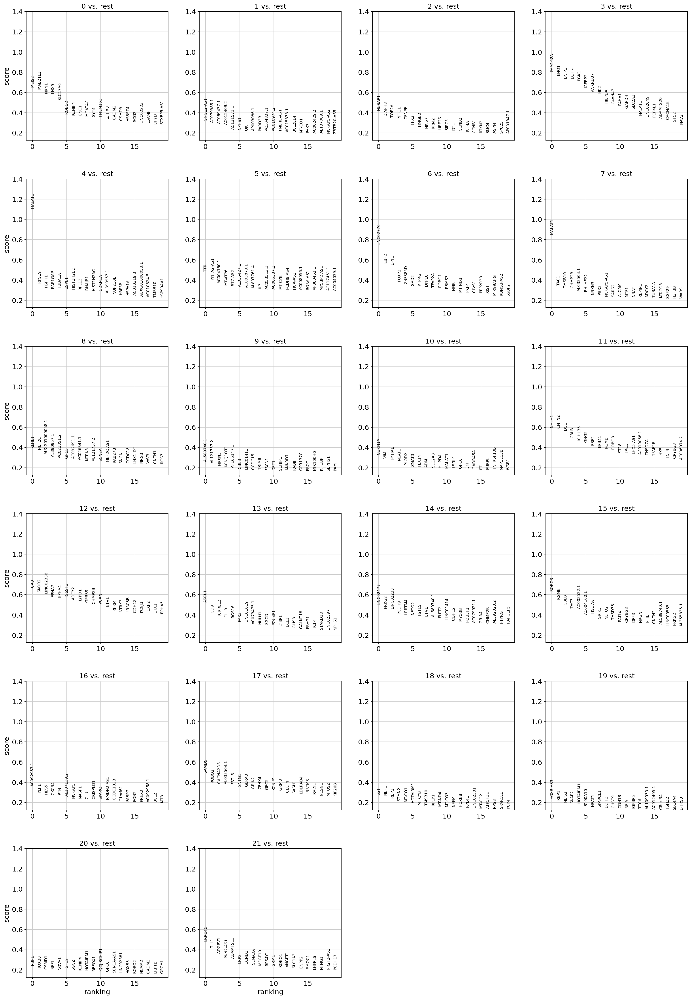

In [59]:
rsc.tl.rank_genes_groups_logreg(adata, groupby="Leiden_1", use_raw=False)
sc.pl.rank_genes_groups(adata)

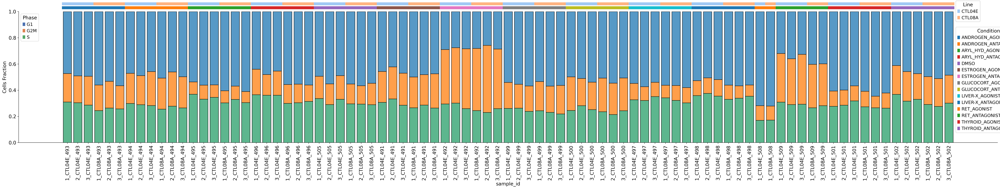

In [61]:
Compositions = adata.obs.groupby(["sample_id","phase"], as_index=False).size()
Compositions["SampleNormSize"] = Compositions["size"].divide(Compositions.groupby("sample_id")["size"].sum().loc[Compositions.sample_id].to_numpy())
Compositions["Condition"] = pd.crosstab(adata.obs["sample_id"], adata.obs["condition"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions["line"] = pd.crosstab(adata.obs["sample_id"], adata.obs["line"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions


import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.patches as mpatches

# Sort the DataFrame by 'Condition' and 'line'
Compositions_sorted = Compositions.sort_values(["Condition", "line"])

# Ensure the sample order is preserved as a categorical type
Compositions_sorted["sample_id"] = pd.Categorical(
    Compositions_sorted["sample_id"],
    Compositions_sorted["sample_id"].unique().tolist()
)

# Plot with sorted x-axis
fig, ax = plt.subplots(1, 1, figsize=(30, 7), dpi=100)
sns.histplot(
    data=Compositions_sorted, 
    x="sample_id", 
    hue="phase", 
    weights="SampleNormSize",
    multiple="stack", 
    shrink=0.8,
    ax=ax
)

ax.set_ylabel("Cells Fraction")
ax.set(ylim=(0, 1))
sns.despine(ax=ax)

# Try to retrieve the auto-generated legend handles/labels for phase
macro_handles, macro_labels = ax.get_legend_handles_labels()
# Remove the auto legend to avoid conflicts.
if ax.get_legend() is not None:
    ax.get_legend().remove()

# If macro_handles is empty, build the legend manually.
if len(macro_handles) == 0:
    macro_unique = Compositions_sorted["phase"].unique()
    # Use a palette (here we use "deep" which is commonly used by seaborn)
    macro_palette = sns.color_palette("deep", n_colors=len(macro_unique))
    macro_dict = {macro: color for macro, color in zip(macro_unique, macro_palette)}
    macro_handles = [mpatches.Patch(color=color, label=macro) for macro, color in macro_dict.items()]
    macro_labels = list(macro_dict.keys())

# Group info by sample_id for Condition and line
group_info = Compositions_sorted.groupby("sample_id").agg({"Condition": "first", "line": "first"})

# Get x positions for categorical data
xticks = ax.get_xticks()
samples_order = list(Compositions_sorted["sample_id"].cat.categories)
sample_to_x = {sample: xtick for sample, xtick in zip(samples_order, xticks)}

# Assign colors for Conditions and lines
unique_conditions = group_info["Condition"].unique()
unique_lines = group_info["line"].unique()
condition_colors = {
    cond: color for cond, color in zip(unique_conditions, sns.color_palette("tab10", n_colors=len(unique_conditions)))
}
line_colors = {
    line: color for line, color in zip(unique_lines, sns.color_palette("pastel", n_colors=len(unique_lines)))
}

# Use a transform that uses data coordinates for x and axes coordinates for y
trans = ax.get_xaxis_transform()

# Add colored bars above the main plot for each sample
for sample, row in group_info.iterrows():
    x_center = sample_to_x[sample]
    rect_width = 1  # each category is assumed to be width 1
    
    ax.add_patch(mpatches.Rectangle((x_center - 0.5, 1.02), rect_width, 0.02,
                                    color=condition_colors[row["Condition"]],
                                    transform=trans,
                                    clip_on=False))
    ax.add_patch(mpatches.Rectangle((x_center - 0.5, 1.05), rect_width, 0.02,
                                    color=line_colors[row["line"]],
                                    transform=trans,
                                    clip_on=False))

# Create custom legends for Condition and line groupings
condition_legend = [mpatches.Patch(color=color, label=cond) for cond, color in condition_colors.items()]
line_legend = [mpatches.Patch(color=color, label=line) for line, color in line_colors.items()]

# Adjust the right margin to make room for legends
fig.subplots_adjust(right=1.5)

# Place legends outside the main axes
legend_macro = ax.legend(handles=macro_handles, labels=macro_labels, title="Phase", loc="upper left", bbox_to_anchor=(0, 1))
ax.add_artist(legend_macro)
legend_condition = ax.legend(handles=condition_legend, title="Condition", loc="upper left", bbox_to_anchor=(.955, .9))
ax.add_artist(legend_condition)
legend_line = ax.legend(handles=line_legend, title="Line", loc="upper left", bbox_to_anchor=(.955, 1.1))
ax.add_artist(legend_line)
ax.grid(False)


plt.xticks(rotation=90)
#plt.savefig(f"./figures/{DS}.Prefilt.scaled.CyclingRate.svg", bbox_inches="tight")
plt.show()


# Final markers plot and annotation

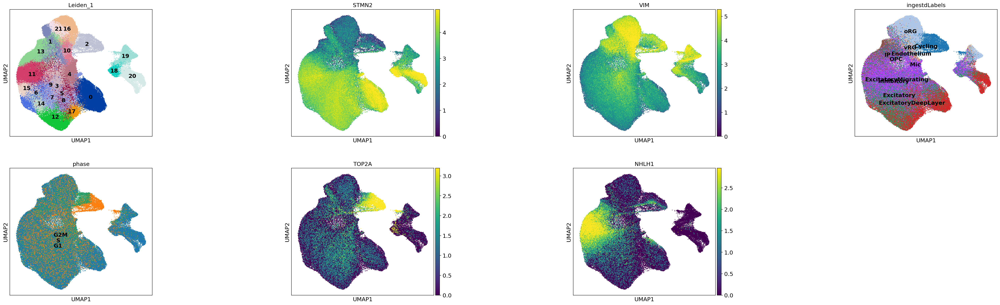

In [62]:
sc.pl.umap(adata, color=["Leiden_1","STMN2","VIM","ingestdLabels","phase","TOP2A","NHLH1"],  size=10, wspace=.8, legend_loc="on data",  vmax="p99")

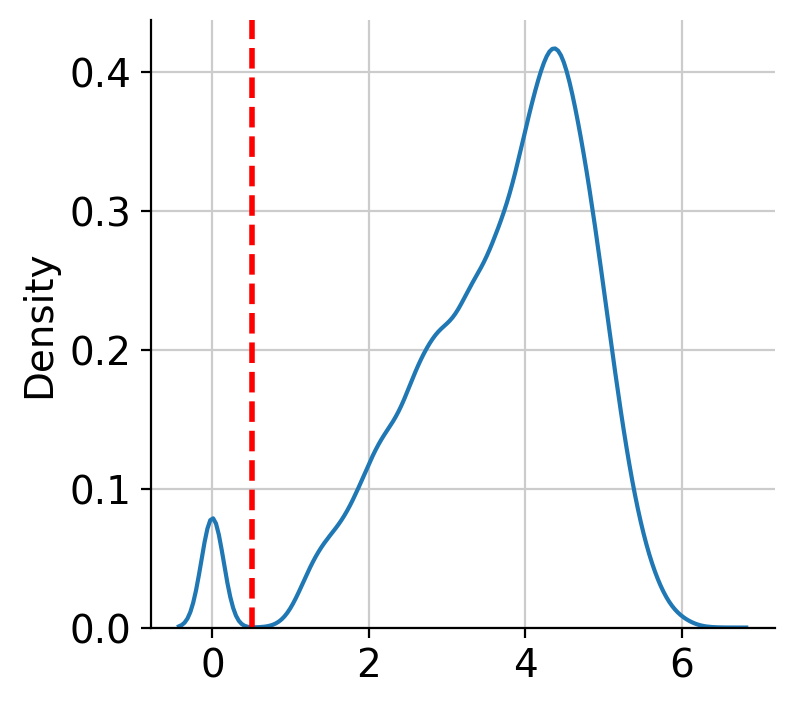

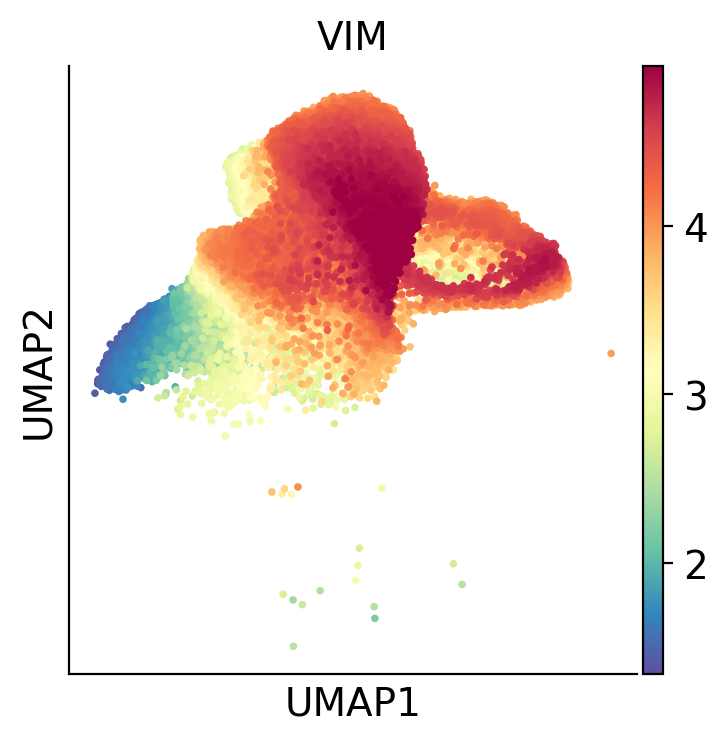

In [74]:
## Refine Progenitors annotation
import palantir
CandidateProgenitors_MainCL = ["1","2","16","21","10","13"]
genes= ["VIM","STMN2"]

CandidateProgenitorCells = []

CandidateProgenitors_Main = adata[adata.obs["Leiden_1"].isin(CandidateProgenitors_MainCL),genes].copy()
#sc.pp.neighbors(CandidateProgenitors_Main, n_neighbors=n_neighbs, n_pcs=pcs, use_rep="X_pca_harmony")
dm_res = palantir.utils.run_diffusion_maps(CandidateProgenitors_Main, knn=n_neighbs, pca_key="X_pca_harmony", n_components=pcs)
ms_data = palantir.utils.determine_multiscale_space(CandidateProgenitors_Main)
imputed_X = palantir.utils.run_magic_imputation(CandidateProgenitors_Main)
sns.kdeplot(CandidateProgenitors_Main[:,"VIM"].X.todense().flatten().A1)
x_value = .5
plt.axvline(x=x_value, color='red', linestyle='--', linewidth=2, label=f"x = {x_value}")

sc.pl.umap(CandidateProgenitors_Main, color=["VIM"],  size=30, wspace=.8, legend_loc="on data",  vmax="p99", layer="MAGIC_imputed_data")


CandidateProgenitors_Main = CandidateProgenitors_Main[(CandidateProgenitors_Main[:,"VIM"].X.todense().flatten().A1 > x_value) | 
(CandidateProgenitors_Main.obs["Leiden_1"].isin(["2","16","21"]))].copy()

CandidateProgenitorCells.extend(CandidateProgenitors_Main.obs_names.tolist())





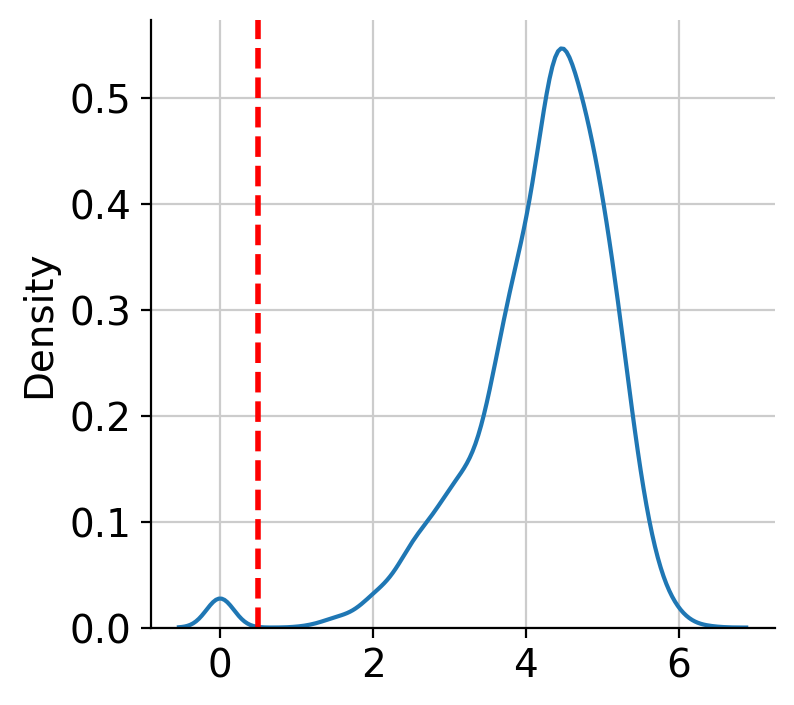

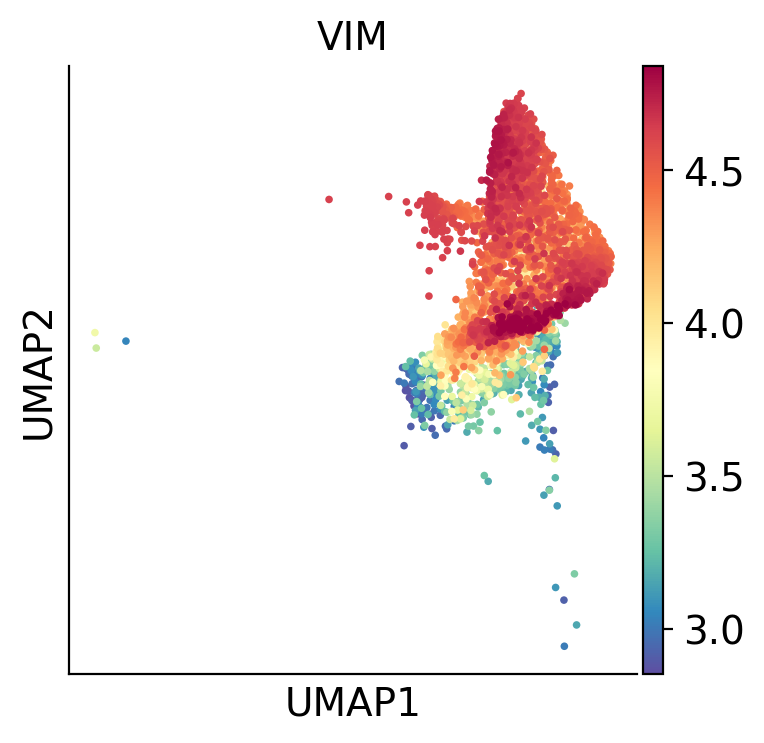

In [75]:
CandidateProgenitors_RetCL = ["19"]
genes= ["VIM"]


CandidateProgenitors_Ret = adata[adata.obs["Leiden_1"].isin(CandidateProgenitors_RetCL),genes].copy()
#sc.pp.neighbors(CandidateProgenitors_Main, n_neighbors=n_neighbs, n_pcs=pcs, use_rep="X_pca_harmony")
dm_res = palantir.utils.run_diffusion_maps(CandidateProgenitors_Ret, knn=n_neighbs, pca_key="X_pca_harmony", n_components=pcs)
ms_data = palantir.utils.determine_multiscale_space(CandidateProgenitors_Ret)
imputed_X = palantir.utils.run_magic_imputation(CandidateProgenitors_Ret)
sns.kdeplot(CandidateProgenitors_Ret[:,"VIM"].X.todense().flatten().A1)
x_value = .5
plt.axvline(x=x_value, color='red', linestyle='--', linewidth=2, label=f"x = {x_value}")
sc.pl.umap(CandidateProgenitors_Ret, color=["VIM"],  size=30, wspace=.8, legend_loc="on data",  vmax="p99", layer="MAGIC_imputed_data")

CandidateProgenitorCells.extend(CandidateProgenitors_Ret.obs_names[(CandidateProgenitors_Ret[:,"VIM"].X.todense().flatten().A1 > .5) | 
(CandidateProgenitors_Ret.obs["Leiden_1"].isin(["19"]))].tolist())

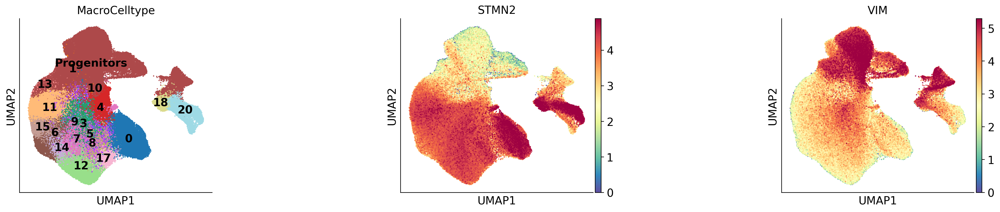

In [76]:
adata.obs["MacroCelltype"] = adata.obs["Leiden_1"].astype(str).copy()
adata.obs.loc[CandidateProgenitorCells,"MacroCelltype"] = "Progenitors"


sc.pl.umap(adata, color=["MacroCelltype","STMN2","VIM"],  size=10, wspace=.8, legend_loc="on data",  vmax="p99")


In [77]:

adata.obs["MacroCelltype"] = np.where(adata.obs["MacroCelltype"] != "Progenitors","Neurons", "Progenitors")

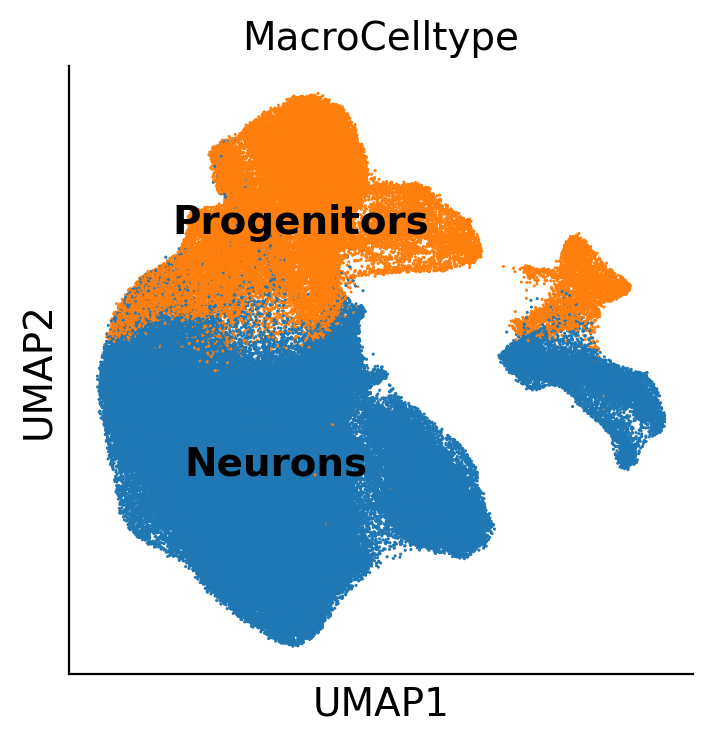

In [78]:
sc.pl.umap(adata, color=["MacroCelltype"],  size=5, wspace=.8, legend_loc="on data",  vmax="p99")

# First compositional plot

In [79]:
os.makedirs("./figures", exist_ok=True)


In [80]:
Compositions = adata.obs.groupby(["sample_id","phase"], as_index=False).size()
Compositions["SampleNormSize"] = Compositions["size"].divide(Compositions.groupby("sample_id")["size"].sum().loc[Compositions.sample_id].to_numpy())
Compositions["Condition"] = pd.crosstab(adata.obs["sample_id"], adata.obs["condition"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions["line"] = pd.crosstab(adata.obs["sample_id"], adata.obs["line"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions

,sample_id,phase,size,SampleNormSize,Condition,line
0,1_CTL04E_491,G1,852,0.456592,ESTROGEN_AGONIST,CTL04E
1,1_CTL04E_491,G2M,440,0.235798,ESTROGEN_AGONIST,CTL04E
2,1_CTL04E_491,S,574,0.307610,ESTROGEN_AGONIST,CTL04E
3,1_CTL04E_492,G1,323,0.288909,ESTROGEN_ANTAGONIST,CTL04E
4,1_CTL04E_492,G2M,465,0.415921,ESTROGEN_ANTAGONIST,CTL04E
...,...,...,...,...,...,...
250,3_CTL08A_505,G2M,266,0.163090,DMSO,CTL08A
251,3_CTL08A_505,S,473,0.290006,DMSO,CTL08A
252,3_CTL08A_509,G1,756,0.397895,RET_ANTAGONIST,CTL08A
253,3_CTL08A_509,G2M,607,0.319474,RET_ANTAGONIST,CTL08A


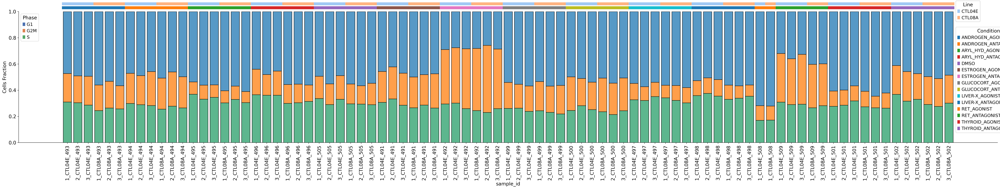

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.patches as mpatches

# Sort the DataFrame by 'Condition' and 'line'
Compositions_sorted = Compositions.sort_values(["Condition", "line"])

# Ensure the sample order is preserved as a categorical type
Compositions_sorted["sample_id"] = pd.Categorical(
    Compositions_sorted["sample_id"],
    Compositions_sorted["sample_id"].unique().tolist()
)

# Plot with sorted x-axis
fig, ax = plt.subplots(1, 1, figsize=(30, 7), dpi=100)
sns.histplot(
    data=Compositions_sorted, 
    x="sample_id", 
    hue="phase", 
    weights="SampleNormSize",
    multiple="stack", 
    shrink=0.8,
    ax=ax
)

ax.set_ylabel("Cells Fraction")
ax.set(ylim=(0, 1))
sns.despine(ax=ax)

# Try to retrieve the auto-generated legend handles/labels for phase
macro_handles, macro_labels = ax.get_legend_handles_labels()
# Remove the auto legend to avoid conflicts.
if ax.get_legend() is not None:
    ax.get_legend().remove()

# If macro_handles is empty, build the legend manually.
if len(macro_handles) == 0:
    macro_unique = Compositions_sorted["phase"].unique()
    # Use a palette (here we use "deep" which is commonly used by seaborn)
    macro_palette = sns.color_palette("deep", n_colors=len(macro_unique))
    macro_dict = {macro: color for macro, color in zip(macro_unique, macro_palette)}
    macro_handles = [mpatches.Patch(color=color, label=macro) for macro, color in macro_dict.items()]
    macro_labels = list(macro_dict.keys())

# Group info by sample_id for Condition and line
group_info = Compositions_sorted.groupby("sample_id").agg({"Condition": "first", "line": "first"})

# Get x positions for categorical data
xticks = ax.get_xticks()
samples_order = list(Compositions_sorted["sample_id"].cat.categories)
sample_to_x = {sample: xtick for sample, xtick in zip(samples_order, xticks)}

# Assign colors for Conditions and lines
unique_conditions = group_info["Condition"].unique()
unique_lines = group_info["line"].unique()
condition_colors = {
    cond: color for cond, color in zip(unique_conditions, sns.color_palette("tab10", n_colors=len(unique_conditions)))
}
line_colors = {
    line: color for line, color in zip(unique_lines, sns.color_palette("pastel", n_colors=len(unique_lines)))
}

# Use a transform that uses data coordinates for x and axes coordinates for y
trans = ax.get_xaxis_transform()

# Add colored bars above the main plot for each sample
for sample, row in group_info.iterrows():
    x_center = sample_to_x[sample]
    rect_width = 1  # each category is assumed to be width 1
    
    ax.add_patch(mpatches.Rectangle((x_center - 0.5, 1.02), rect_width, 0.02,
                                    color=condition_colors[row["Condition"]],
                                    transform=trans,
                                    clip_on=False))
    ax.add_patch(mpatches.Rectangle((x_center - 0.5, 1.05), rect_width, 0.02,
                                    color=line_colors[row["line"]],
                                    transform=trans,
                                    clip_on=False))

# Create custom legends for Condition and line groupings
condition_legend = [mpatches.Patch(color=color, label=cond) for cond, color in condition_colors.items()]
line_legend = [mpatches.Patch(color=color, label=line) for line, color in line_colors.items()]

# Adjust the right margin to make room for legends
fig.subplots_adjust(right=1.5)

# Place legends outside the main axes
legend_macro = ax.legend(handles=macro_handles, labels=macro_labels, title="Phase", loc="upper left", bbox_to_anchor=(0, 1))
ax.add_artist(legend_macro)
legend_condition = ax.legend(handles=condition_legend, title="Condition", loc="upper left", bbox_to_anchor=(.955, .9))
ax.add_artist(legend_condition)
legend_line = ax.legend(handles=line_legend, title="Line", loc="upper left", bbox_to_anchor=(.955, 1.1))
ax.add_artist(legend_line)
ax.grid(False)


plt.xticks(rotation=90)
plt.savefig(f"./figures/{DS}.CyclingRate.Postfilt.svg", bbox_inches="tight")
plt.show()


In [84]:
Compositions = adata.obs.groupby(["sample_id","MacroCelltype"], as_index=False).size()
Compositions["SampleNormSize"] = Compositions["size"].divide(Compositions.groupby("sample_id")["size"].sum().loc[Compositions.sample_id].to_numpy())
Compositions["Condition"] = pd.crosstab(adata.obs["sample_id"], adata.obs["condition"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions["line"] = pd.crosstab(adata.obs["sample_id"], adata.obs["line"]).idxmax(axis=1)[Compositions["sample_id"]].tolist()
Compositions

,sample_id,MacroCelltype,size,SampleNormSize,Condition,line
0,1_CTL04E_491,Neurons,1109,0.594319,ESTROGEN_AGONIST,CTL04E
1,1_CTL04E_491,Progenitors,757,0.405681,ESTROGEN_AGONIST,CTL04E
2,1_CTL04E_492,Neurons,696,0.622540,ESTROGEN_ANTAGONIST,CTL04E
3,1_CTL04E_492,Progenitors,422,0.377460,ESTROGEN_ANTAGONIST,CTL04E
4,1_CTL04E_493,Neurons,1009,0.671771,ANDROGEN_AGONIST,CTL04E
...,...,...,...,...,...,...
165,3_CTL08A_502,Progenitors,454,0.181238,THYROID_ANTAGONIST,CTL08A
166,3_CTL08A_505,Neurons,1349,0.827100,DMSO,CTL08A
167,3_CTL08A_505,Progenitors,282,0.172900,DMSO,CTL08A
168,3_CTL08A_509,Neurons,1572,0.827368,RET_ANTAGONIST,CTL08A


# Save

In [87]:
del adata.layers["scaled"]

In [90]:
del adata.layers["logNorm"]

In [91]:
if issparse(adata.X) == False:
    adata.X = csr_matrix(adata.X)
    print('Converted adata.X to', type(adata.X))

if issparse(adata.layers["counts"]) == False:
    adata.layers["counts"] = csr_matrix(adata.layers["counts"])
    print('Converted counts layer to', type(adata.layers["counts"]))


In [92]:
pd.crosstab(adata.obs["condition"], adata.obs["phase"]).divide(
    pd.crosstab(adata.obs["condition"], adata.obs["phase"]).sum(axis=1), axis=0
)

phase,G1,G2M,S
condition,,,
ANDROGEN_AGONIST,0.526157,0.199914,0.273928
ANDROGEN_ANTAGONIST,0.482227,0.240456,0.277317
ARYL_HYD_AGONIST,0.574189,0.095327,0.330484
ARYL_HYD_ANTAGONIST,0.508253,0.157387,0.334360
DMSO,0.537604,0.158346,0.304050
ESTROGEN_AGONIST,0.469041,0.242689,0.288270
ESTROGEN_ANTAGONIST,0.278337,0.459936,0.261727
GLUCOCORT_AGONIST,0.554521,0.205676,0.239802
GLUCOCORT_ANTAGONIST,0.516153,0.240498,0.243349


In [93]:
adata.write_h5ad("./adatas/6.1.Annotated.{}.h5ad".format(DS))


In [94]:
adata = sc.read_h5ad("./adatas/6.1.Annotated.{}.h5ad".format(DS))

# Save for cellXgene

In [96]:
# Save for cellxgene
tmp = adata.copy()
import scipy.sparse as sp


    

del tmp.uns
del tmp.varm
del tmp.obsp
del tmp.layers
tmp.obs.columns[tmp.obs.isna().any()].tolist()
tmp.obs = tmp.obs.astype(str)

tmp.write_h5ad("/group/testa/Common/scRNAseq/visualization/ENDPOINTS_sc/6.1.Annotated.{}.h5ad".format(DS))

In [97]:
dir_path = "./adatas/{}_ByMacroCelltype".format(DS)
if not os.path.exists(dir_path):
    os.makedirs(dir_path)
for celltype in adata.obs.MacroCelltype.unique():
    adata[adata.obs["MacroCelltype"] == celltype].write_h5ad(dir_path+"/{}.{}.h5ad".format(DS,celltype))

In [98]:
# Also save annotation obs

adata.obs[["MacroCelltype"]].to_excel(dir_path+"/{}.Annotation_{}.xlsx".format(DS, adata.shape[0]))